In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import random
import datetime
import scipy as sci
from scipy.integrate import odeint
from scipy.integrate import solve_ivp

In [2]:
v0=2 # Reference velocity for self-propelled particles
N=40 #number of agents


##ring
# lambda1 = -6.333E-02
# lambda2 = 9.598E-01
# lambda3 = -7.925E-01
# lambda4 = -1.123E-01
# power1 = -1.599E-01
# power2 = 5.292E-02
# power3 = 9.206E-02


# #clumps
# lambda1 = -1.076E-01
# lambda2 = -4.643E-05
# lambda3 = 8.328E-01
# lambda4 = -6.884E-01
# power1 = 2.932E-01
# power2 = -4.218E-02
# power3 = -4.846E-04


# # # double mill
# lambda1 = 6.008E-02
# lambda2 = 1.793E-01
# lambda3 = -2.711E-01
# lambda4 = 2.714E-01
# power1 = 6.875E-03
# power2 = 3.824E-02
# power3 = 4.264E-01

#single mill
lambda1 =  -5.406E-01
lambda2 = 8.589E-01
lambda3 = 5.433E-01
lambda4 = 5.192E-01
power1 = 7.426E-01
power2 = 3.296E-02
power3 = -3.231E-02



def obstacle_interaction(pos, margin=1.0):
    F = np.zeros(2)
    for i, center in enumerate(obstacle_positions):
        r_o = obstacle_radii[i]
        diff = pos - center
        dist = np.linalg.norm(diff)
        d = dist - r_o  # Distance from obstacle boundary (center distance - radius)

        if d < margin:
            F_io_dir = diff / dist          # Unit vector indicating direction
            F += F_io_dir / (d**2)          # Magnitude: inversely proportional to the square of the distance

    return F



def infer_x(s,i,j):
    x1=s[i]  #self
    y1=s[i+n]  #self
    x2=s[j]
    y2=s[j+n]
    dist=((x1-x2)**2 + (y1-y2)**2)**(1/2)

    return (x1-x2)/dist*(lambda1*(dist**power1)+lambda2*(dist**power2)+lambda3*(dist**power3)\
                         +lambda4)


def infer_y(s,i,j):
    x1=s[i]  #self
    y1=s[i+n]  #self
    x2=s[j]
    y2=s[j+n]
    dist=((x1-x2)**2 + (y2-y1)**2)**(1/2)

    return (y1-y2)/dist*(lambda1*(dist**power1)+lambda2*(dist**power2)+lambda3*(dist**power3)\
                         +lambda4)


def total_infer_x(s,i):
    others_index=list(range(n))
    others_index.remove(i)
    total_interaction_x = sum([infer_x(s,i,j) for j in others_index])
    v_i_x = s[2*n+i]
    v_i_y = s[3*n+i]
    v_i_mag = (v_i_x**2 + v_i_y**2)**(1/2)
    self_propel_x = (v_i_x/v_i_mag) * (v0 - v_i_mag)

    pos_i = np.array([s[i], s[i+n]])
    obs_force_x = obstacle_interaction(pos_i, obs_margin)[0]

    return self_propel_x + total_interaction_x + obs_force_x

def total_infer_y(s,i):
    others_index=list(range(n))
    others_index.remove(i)
    total_interaction_y = sum([infer_y(s,i,j) for j in others_index])
    v_i_x = s[2*n+i]
    v_i_y = s[3*n+i]
    v_i_mag = (v_i_x**2 + v_i_y**2)**(1/2)
    self_propel_y = (v_i_y/v_i_mag) * (v0 - v_i_mag)

    pos_i = np.array([s[i], s[i+n]])
    obs_force_y = obstacle_interaction(pos_i, obs_margin)[1]

    return self_propel_y + total_interaction_y + obs_force_y

def F_infer_ivp(t,s):
    return np.concatenate((s[2*n:3*n],s[3*n:4*n],
                           [total_infer_x(s,i) for i in range(n)]+np.random.normal(0,1,size=n), 
                           [total_infer_y(s,i) for i in range(n)]+np.random.normal(0,1,size=n)))


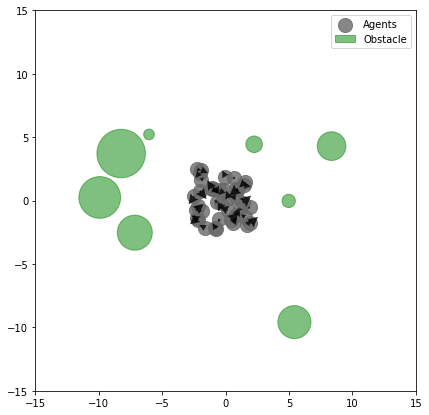

In [3]:
########## Initial condition (with obstacle avoidance) ##########
range_init = 2.5
position_list_x = []
position_list_y = []
velocity_list_x = []
velocity_list_y = []

random.seed(101)

for i in range(40):
    position_list_x.append(random.uniform(-range_init, range_init))
    position_list_y.append(random.uniform(-range_init, range_init))
    velocity_list_x.append(random.uniform(-1.0, 1.0))
    velocity_list_y.append(random.uniform(-1.0, 1.0))

nodes_np = np.array([position_list_x, position_list_y, velocity_list_x, velocity_list_y], dtype=np.float32)

s0 = nodes_np.reshape(-1)
n = nodes_np.shape[1]


########## Define the obstacles ##########

num_obstacles = 8
obs_margin = 1.0
arena_size = 10
np.random.seed(10)

obstacle_positions = []
obstacle_radii = []

def is_outside_agent_area(x, y, margin=range_init):
    return abs(x) > margin or abs(y) > margin  # Valid if at least one coordinate is outside the agent area

while len(obstacle_positions) < num_obstacles:
    x, y = np.random.uniform(-arena_size, arena_size, size=2)
    if is_outside_agent_area(x, y):
        obstacle_positions.append([x, y])
        obstacle_radii.append(np.random.uniform(0.1, 2.0))

obstacle_positions = np.array(obstacle_positions)
obstacle_radii = np.array(obstacle_radii)


########## Visualization of Initial Positions and Velocities ##########

# Define colors
agent_color = np.array([105./255, 105./255, 105./255, 0.8])
init_color = np.array([0., 0., 0.])  # Default color when no rotational color is applied

fig, ax = plt.subplots(figsize=(7, 7))

# Initial positions of agents
ax.scatter(position_list_x, position_list_y, color=agent_color, s=200, label='Agents')

# Velocity vectors (quiver)
origin = np.array([position_list_x, position_list_y])
velocity_array = np.array([velocity_list_x, velocity_list_y])
quiver_color = [np.append(init_color, 0.8) for _ in range(N)]

plt.quiver(*origin, velocity_array[0], velocity_array[1],
           scale_units='xy', angles='xy', color=quiver_color,
           scale=1.5, width=0.006, headwidth=5, zorder=2)

# Visualize obstacles
for pos, r in zip(obstacle_positions, obstacle_radii):
    circle = plt.Circle(pos, r, color='green', alpha=0.5, label='Obstacle')
    ax.add_patch(circle)

# Visualization settings
ax.set_aspect('equal')
ax.set_xlim(-15, 15)
ax.set_ylim(-15, 15)

# Legend (remove duplicates)
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())

plt.show()


In [4]:
dt=0.1
T=200
t=np.arange(0,T+dt,dt)

solution=solve_ivp(F_infer_ivp,[0,T],s0, method='RK45', max_step=0.01, t_eval=t)

print(solution)

  message: 'The solver successfully reached the end of the integration interval.'
     nfev: 1102916
     njev: 0
      nlu: 0
      sol: None
   status: 0
  success: True
        t: array([0.000e+00, 1.000e-01, 2.000e-01, ..., 1.998e+02, 1.999e+02,
       2.000e+02])
 t_events: None
        y: array([[ 0.40576068,  0.52508733,  0.69383739, ..., -8.62436121,
        -8.61188088, -8.58430229],
       [-0.16430661, -0.21320506, -0.24401787, ..., -9.94626099,
        -9.96262393, -9.97178858],
       [-1.05738783, -1.16715963, -1.3719996 , ..., -5.36970224,
        -5.425583  , -5.49304058],
       ...,
       [ 0.84419358,  0.9992843 ,  1.15420603, ...,  0.03905538,
        -0.04746602, -0.14707248],
       [-0.45173222, -0.71326761, -0.85277292, ..., -1.71219092,
        -1.72177499, -1.75582824],
       [ 0.71537834, -1.2574272 , -3.00344041, ..., -1.07120589,
        -1.01257519, -0.94221448]])
 y_events: None


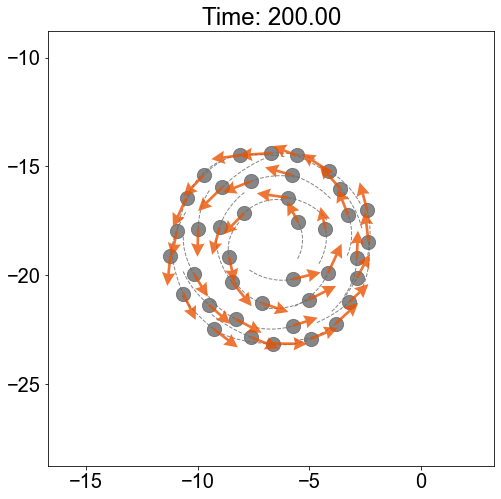

In [5]:
##### Plot the solution #####

import matplotlib.animation as animation

solution_plot = np.transpose(solution.y)

speed = 1
t_plot = np.arange(0, T + dt * speed, dt * speed)
h = solution_plot[:, 0:2*n]
velocity = solution_plot[:, 2*n:4*n]

fig = plt.figure(figsize=(8, 8))
ax = plt.axes()

tail_length = 10

############################### Order Parameter ###############################
velocity_x = velocity[:, 0:n]
velocity_y = velocity[:, n:]
center_x = np.mean(h[:, 0:n], axis=1, keepdims=True)
center_y = np.mean(h[:, n:], axis=1, keepdims=True)
r_x, r_y = h[:, 0:n] - center_x, h[:, n:] - center_y

r_mag = np.sqrt(np.square(r_x) + np.square(r_y))
vel_mag = np.sqrt(np.square(velocity_x) + np.square(velocity_y))  # N × time velocity magnitude
vel_mag_sum = np.sum(vel_mag, axis=1)

vel_x_sum = np.sum(velocity_x, axis=1)
vel_y_sum = np.sum(velocity_y, axis=1)

vel_vec_mag = np.sqrt(np.square(vel_x_sum) + np.square(vel_y_sum))  # Magnitude of total velocity vector

order_para = vel_vec_mag / vel_mag_sum

ang_mom = r_x * velocity_y - r_y * velocity_x

denom = np.sum(r_mag * vel_mag, axis=1)
ang_mom_sum = np.abs(np.sum(ang_mom, axis=1))
ang_mom_abs = np.sum(np.abs(ang_mom), axis=1)

order_para_rot = ang_mom_sum / denom
order_para_rot_abs = ang_mom_abs / denom

############################### Color Definitions ###############################
init_color = np.array([0., 0., 0.])
cw_color = np.array([0., 100., 250.])         # Clockwise rotation color
ccw_color = np.array([240., 84., 0.])         # Counter-clockwise rotation color
flock_color = np.array([145., 84., 192.])
agent_color = np.array([105./255, 105./255, 105./255, 0.8])

plt.rc('font', size=20, family='Arial')

############################### Animation Function ###############################

def animate(i):
    window = 10
    ax.clear()

    # Agent positions and trails
    plt.scatter(h[i*speed, 0:n], h[i*speed, n:], color=agent_color, s=200, zorder=0)
    for j in range(n):
        ax.plot(h[i*speed - tail_length:i*speed+1, j],
                h[i*speed - tail_length:i*speed+1, n+j],
                '--', c=agent_color, lw=1, ms=1)

    # Add obstacles
    for k in range(len(obstacle_positions)):
        obstacle_circle = plt.Circle(
            obstacle_positions[k],
            obstacle_radii[k],
            color='green',
            alpha=0.5,
            zorder=1
        )
        ax.add_patch(obstacle_circle)

    # Direction vectors (quiver)
    rot_color = []
    for ii in range(len(ang_mom[i*speed, :])):
        if ang_mom[i*speed, ii] > 0 and order_para_rot_abs[i*speed] > 0.7:
            # Strong counter-clockwise rotation
            rot_color.append(np.append(ccw_color * (order_para_rot_abs[i*speed] - 0.7) / 0.3 / 255, [0.8]))
        elif ang_mom[i*speed, ii] < 0 and order_para_rot_abs[i*speed] > 0.7:
            # Strong clockwise rotation
            rot_color.append(np.append(cw_color * (order_para_rot_abs[i*speed] - 0.7) / 0.3 / 255, [0.8]))
        else:
            # No significant rotation
            rot_color.append(np.append(init_color, [0.8]))

    origin = np.array([h[i*speed, 0:n], h[i*speed, n:]])
    plt.quiver(*origin, velocity[i*speed, 0:n], velocity[i*speed, n:],
               scale_units='xy', angles='xy', color=rot_color,
               scale=1.5, width=0.006, headwidth=5, zorder=2)

    # Center the camera on the current center of mass
    center_x_i = np.mean(h[i*speed, 0:n])
    center_y_i = np.mean(h[i*speed, n:])
    ax.set_title('Time: {:.2f}'.format(t[i*speed]))
    ax.set_xticks(np.arange(-100, 100, 5))
    ax.set_yticks(np.arange(-100, 100, 5))
    ax.set_xlim(center_x_i - window, center_x_i + window)
    ax.set_ylim(center_y_i - window, center_y_i + window)

# Run animation
anim = animation.FuncAnimation(fig, animate, frames=len(t_plot))

from IPython.display import HTML
HTML(anim.to_html5_video())
